In [14]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tifffile
import os
from matplotlib.patches import Rectangle
from skimage import measure
import cv2
from matplotlib.colors import LinearSegmentedColormap


In [15]:
# Define paths
real_tiff_path = "../cell_profiler_input/real_tiff/images"
outlines_path = "real_outlines"

# Define the first image to load (r01c01f01)
image_prefix = "r01c01f01_pred"

# Load all five channels: AGP, ER, DNA, Mito, RNA
agp_img = tifffile.imread(os.path.join(real_tiff_path, f"{image_prefix}_AGP.tif"))
er_img = tifffile.imread(os.path.join(real_tiff_path, f"{image_prefix}_ER.tif"))
dna_img = tifffile.imread(os.path.join(real_tiff_path, f"{image_prefix}_DNA.tif"))
mito_img = tifffile.imread(os.path.join(real_tiff_path, f"{image_prefix}_Mito.tif"))
rna_img = tifffile.imread(os.path.join(real_tiff_path, f"{image_prefix}_RNA.tif"))

print(f"AGP image shape: {agp_img.shape}")
print(f"ER image shape: {er_img.shape}")
print(f"DNA image shape: {dna_img.shape}")
print(f"Mito image shape: {mito_img.shape}")
print(f"RNA image shape: {rna_img.shape}")
print(f"AGP image dtype: {agp_img.dtype}")
print(f"AGP image range: {agp_img.min()} - {agp_img.max()}")


AGP image shape: (512, 512)
ER image shape: (512, 512)
DNA image shape: (512, 512)
Mito image shape: (512, 512)
RNA image shape: (512, 512)
AGP image dtype: float32
AGP image range: 0.0 - 1.0


In [16]:
# Define channel names and their display colors
channel_names = ['Mito', 'AGP', 'RNA', 'ER', 'DNA']

# Define hex colors for all channels
hex_cols = {
    'red':    '#800000',   # dark red for Mito
    'orange': '#CC5500',   # burnt orange for AGP
    'yellow': '#999900',   # darker mustard for RNA
    'green':  '#006400',   # dark green for ER
    'blue':   '#1E90FF',   # medium blue for DNA
}

# Create custom colormaps
cmaps = {}
for name, hexc in hex_cols.items():
    cmaps[name] = LinearSegmentedColormap.from_list(
        f"{name}_cmap",
        [(0.0, '#000000'), (1.0, hexc)],
        N=256
    )

# Map channel names to colormap names
channel_to_cmap = {
    'Mito': 'red',
    'AGP': 'orange', 
    'RNA': 'yellow',
    'ER': 'green',
    'DNA': 'blue'
}

# Convert hex colors to RGB values (0-1 range) for composite creation
color_rgb = {}
for name, hex_color in hex_cols.items():
    hex_color = hex_color.lstrip('#')
    r = int(hex_color[0:2], 16) / 255.0
    g = int(hex_color[2:4], 16) / 255.0
    b = int(hex_color[4:6], 16) / 255.0
    color_rgb[name] = np.array([r, g, b])

# Function to normalize and create RGB composite using custom colors
def create_composite(img_data):
    """Create RGB composite using custom colors for all channels"""
    if len(img_data.shape) == 3:
        height, width = img_data.shape[1], img_data.shape[2]
        composite = np.zeros((height, width, 3))
        
        # Normalize each channel to 0-1 range
        normalized_channels = {}
        for channel_idx in range(min(len(channel_names), img_data.shape[0])):
            channel_data = img_data[channel_idx].astype(np.float32)
            img_min, img_max = channel_data.min(), channel_data.max()
            if img_max > img_min:
                normalized_channels[channel_idx] = (channel_data - img_min) / (img_max - img_min)
            else:
                normalized_channels[channel_idx] = channel_data
        
        # Add each channel with its corresponding color
        for channel_idx, channel_name in enumerate(channel_names):
            if channel_idx in normalized_channels:
                # Use channel_to_cmap mapping to get the correct color key
                cmap_name = channel_to_cmap.get(channel_name, 'red')
                if cmap_name in color_rgb:
                    color = color_rgb[cmap_name]
                    for c in range(3):  # RGB channels
                        composite[:, :, c] += normalized_channels[channel_idx] * color[c]
        
        # Normalize composite to 0-1 range
        composite = (composite - composite.min()) / (composite.max() - composite.min())
        return composite
    return None

# Stack the images into the expected format (channels, height, width)
img_data = np.stack([mito_img, agp_img, rna_img, er_img, dna_img], axis=0)

# Create the RGB composite using the function
rgb_overlay = create_composite(img_data)

print(f"Image data shape: {img_data.shape}")
print(f"RGB overlay shape: {rgb_overlay.shape if rgb_overlay is not None else 'None'}")
print(f"RGB overlay range: {rgb_overlay.min() if rgb_overlay is not None else 'None'} - {rgb_overlay.max() if rgb_overlay is not None else 'None'}")


Image data shape: (5, 512, 512)
RGB overlay shape: (512, 512, 3)
RGB overlay range: 0.0 - 1.0


In [17]:
# Load outlines for both real and rescellDM
real_outlines_path = "real_outlines"
rescelldm_outlines_path = "res_cell_dm_outlines"

# Load real outlines
outline_files_real = [f for f in os.listdir(real_outlines_path) if "1_s1" in f]
print("Available real outline files for sample 1_s1:")
for f in outline_files_real:
    print(f"  {f}")

# Load rescellDM outlines
outline_files_rescelldm = [f for f in os.listdir(rescelldm_outlines_path) if "1_s1" in f]
print("\nAvailable rescellDM outline files for sample 1_s1:")
for f in outline_files_rescelldm:
    print(f"  {f}")

# Load real nuclei and cell outlines
real_nuclei_outline_path = os.path.join(real_outlines_path, "1_s1--nuclei_outlines.png")
real_cell_outline_path = os.path.join(real_outlines_path, "1_s1--cell_outlines.png")

real_nuclei_outlines = plt.imread(real_nuclei_outline_path)
real_cell_outlines = plt.imread(real_cell_outline_path)

# Load rescellDM nuclei and cell outlines
rescelldm_nuclei_outline_path = os.path.join(rescelldm_outlines_path, "1_s1--nuclei_outlines.png")
rescelldm_cell_outline_path = os.path.join(rescelldm_outlines_path, "1_s1--cell_outlines.png")

rescelldm_nuclei_outlines = plt.imread(rescelldm_nuclei_outline_path)
rescelldm_cell_outlines = plt.imread(rescelldm_cell_outline_path)

print(f"\nReal nuclei outlines shape: {real_nuclei_outlines.shape}")
print(f"Real cell outlines shape: {real_cell_outlines.shape}")
print(f"RescellDM nuclei outlines shape: {rescelldm_nuclei_outlines.shape}")
print(f"RescellDM cell outlines shape: {rescelldm_cell_outlines.shape}")
print(f"RGB overlay shape: {rgb_overlay.shape}")


Available real outline files for sample 1_s1:
  1_s1--cell_outlines.png
  1_s1--nuclei_outlines.png

Available rescellDM outline files for sample 1_s1:
  1_s1--cell_outlines.png
  1_s1--nuclei_outlines.png

Real nuclei outlines shape: (512, 512)
Real cell outlines shape: (512, 512)
RescellDM nuclei outlines shape: (512, 512)
RescellDM cell outlines shape: (512, 512)
RGB overlay shape: (512, 512, 3)


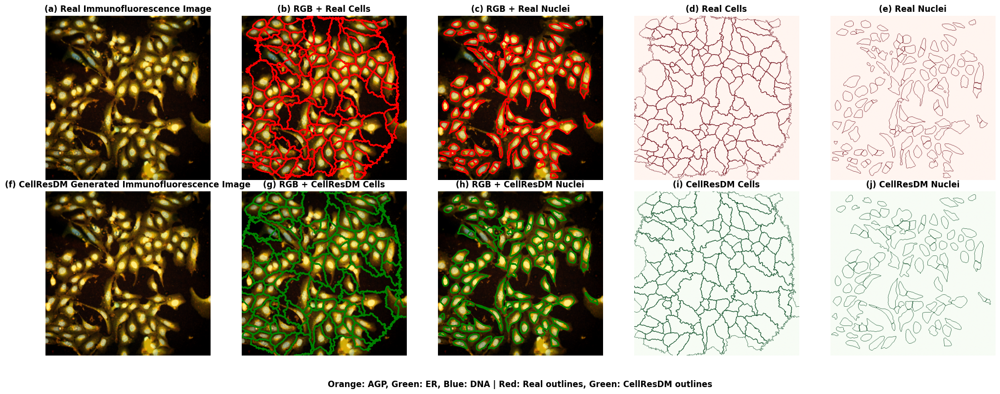

In [18]:
# Create a 2x5 subplot layout for comprehensive comparison
fig, axes = plt.subplots(2, 5, figsize=(20, 8))

# First row: Real outlines
# (a) Plain RGB image
axes[0, 0].imshow(rgb_overlay)
axes[0, 0].set_title('(a) Real Immunofluorescence Image', fontsize=12, fontweight='bold')
axes[0, 0].axis('off')

# (b) RGB + Real cell outlines
axes[0, 1].imshow(rgb_overlay)
real_cell_edges = real_cell_outlines[:, :, 0] if len(real_cell_outlines.shape) == 3 else real_cell_outlines
axes[0, 1].contour(real_cell_edges, levels=[0.5], colors='red', linewidths=1.5)
axes[0, 1].set_title('(b) RGB + Real Cells', fontsize=12, fontweight='bold')
axes[0, 1].axis('off')

# (c) RGB + Real nuclei outlines
axes[0, 2].imshow(rgb_overlay)
real_nuclei_edges = real_nuclei_outlines[:, :, 0] if len(real_nuclei_outlines.shape) == 3 else real_nuclei_outlines
axes[0, 2].contour(real_nuclei_edges, levels=[0.5], colors='red', linewidths=1.5)
axes[0, 2].set_title('(c) RGB + Real Nuclei', fontsize=12, fontweight='bold')
axes[0, 2].axis('off')

# (d) Real cell outlines only
axes[0, 3].imshow(real_cell_outlines, cmap='Reds')
axes[0, 3].set_title('(d) Real Cells', fontsize=12, fontweight='bold')
axes[0, 3].axis('off')

# (e) Real nuclei outlines only
axes[0, 4].imshow(real_nuclei_outlines, cmap='Reds')
axes[0, 4].set_title('(e) Real Nuclei', fontsize=12, fontweight='bold')
axes[0, 4].axis('off')

# Second row: RescellDM outlines
# (f) Plain RGB image
axes[1, 0].imshow(rgb_overlay)
axes[1, 0].set_title('(f) CellResDM Generated Immunofluorescence Image', fontsize=12, fontweight='bold')
axes[1, 0].axis('off')

# (g) RGB + RescellDM cell outlines
axes[1, 1].imshow(rgb_overlay)
rescelldm_cell_edges = rescelldm_cell_outlines[:, :, 0] if len(rescelldm_cell_outlines.shape) == 3 else rescelldm_cell_outlines
axes[1, 1].contour(rescelldm_cell_edges, levels=[0.5], colors='green', linewidths=1.5)
axes[1, 1].set_title('(g) RGB + CellResDM Cells', fontsize=12, fontweight='bold')
axes[1, 1].axis('off')

# (h) RGB + RescellDM nuclei outlines
axes[1, 2].imshow(rgb_overlay)
rescelldm_nuclei_edges = rescelldm_nuclei_outlines[:, :, 0] if len(rescelldm_nuclei_outlines.shape) == 3 else rescelldm_nuclei_outlines
axes[1, 2].contour(rescelldm_nuclei_edges, levels=[0.5], colors='green', linewidths=1.5)
axes[1, 2].set_title('(h) RGB + CellResDM Nuclei', fontsize=12, fontweight='bold')
axes[1, 2].axis('off')

# (i) RescellDM cell outlines only
axes[1, 3].imshow(rescelldm_cell_outlines, cmap='Greens')
axes[1, 3].set_title('(i) CellResDM Cells', fontsize=12, fontweight='bold')
axes[1, 3].axis('off')

# (j) RescellDM nuclei outlines only
axes[1, 4].imshow(rescelldm_nuclei_outlines, cmap='Greens')
axes[1, 4].set_title('(j) CellResDM Nuclei', fontsize=12, fontweight='bold')
axes[1, 4].axis('off')

# Add comprehensive legend
fig.text(0.5, 0.02, 'Orange: AGP, Green: ER, Blue: DNA | Red: Real outlines, Green: CellResDM outlines', 
         ha='center', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.subplots_adjust(bottom=0.1)
plt.show()


In [19]:
# Load and compare all methods - show individual channels and composites
methods = ['real', 'pix2pix', 'rescelldm', 'rescelldm_2step', 'unet', 'deephcs']
method_data = {}

# Load data for all methods
for method in methods:
    try:
        # Load the first image prediction
        img_path = f"../cell_profiler_original_files/{method}/r01c01f01p01_pred.npy"
        img_data = np.load(img_path)
        method_data[method] = img_data
        print(f"Loaded {method}: shape {img_data.shape}, range [{img_data.min():.3f}, {img_data.max():.3f}]")
    except Exception as e:
        print(f"Could not load {method}: {e}")

print(f"\nSuccessfully loaded {len(method_data)} methods")


Loaded real: shape (5, 512, 512), range [0.000, 1.000]
Loaded pix2pix: shape (5, 512, 512), range [-0.216, 1.000]
Loaded rescelldm: shape (5, 512, 512), range [-0.171, 2.240]
Loaded rescelldm_2step: shape (5, 512, 512), range [-0.061, 1.080]
Loaded unet: shape (5, 512, 512), range [-0.028, 1.098]
Loaded deephcs: shape (5, 512, 512), range [0.000, 1.145]

Successfully loaded 6 methods


In [20]:
# Define channel names and their display colors
channel_names = ['Mito', 'AGP', 'RNA', 'ER', 'DNA']

# Define hex colors for all channels
hex_cols = {
    'red':    '#800000',   # dark red for Mito
    'orange': '#CC5500',   # burnt orange for AGP
    'yellow': '#999900',   # darker mustard for RNA
    'green':  '#006400',   # dark green for ER
    'blue':   '#1E90FF',   # medium blue for DNA
}

# Create custom colormaps
cmaps = {}
for name, hexc in hex_cols.items():
    cmaps[name] = LinearSegmentedColormap.from_list(
        f"{name}_cmap",
        [(0.0, '#000000'), (1.0, hexc)],
        N=256
    )

# Map channel names to colormap names
channel_to_cmap = {
    'Mito': 'red',
    'AGP': 'orange', 
    'RNA': 'yellow',
    'ER': 'green',
    'DNA': 'blue'
}

# Convert hex colors to RGB values (0-1 range) for composite creation
color_rgb = {}
for name, hex_color in hex_cols.items():
    hex_color = hex_color.lstrip('#')
    r = int(hex_color[0:2], 16) / 255.0
    g = int(hex_color[2:4], 16) / 255.0
    b = int(hex_color[4:6], 16) / 255.0
    color_rgb[name] = np.array([r, g, b])

# Function to normalize and create RGB composite using custom colors
def create_composite(img_data):
    """Create RGB composite using custom colors for all channels"""
    if len(img_data.shape) == 3:
        height, width = img_data.shape[1], img_data.shape[2]
        composite = np.zeros((height, width, 3))
        
        # Normalize each channel to 0-1 range
        normalized_channels = {}
        for channel_idx in range(min(len(channel_names), img_data.shape[0])):
            channel_data = img_data[channel_idx].astype(np.float32)
            img_min, img_max = channel_data.min(), channel_data.max()
            if img_max > img_min:
                normalized_channels[channel_idx] = (channel_data - img_min) / (img_max - img_min)
            else:
                normalized_channels[channel_idx] = channel_data
        
        # Add each channel with its corresponding color
        for channel_idx, channel_name in enumerate(channel_names):
            if channel_idx in normalized_channels:
                # Use channel_to_cmap mapping to get the correct color key
                cmap_name = channel_to_cmap.get(channel_name, 'red')
                if cmap_name in color_rgb:
                    color = color_rgb[cmap_name]
                    for c in range(3):  # RGB channels
                        composite[:, :, c] += normalized_channels[channel_idx] * color[c]
        
        # Normalize composite to 0-1 range
        composite = (composite - composite.min()) / (composite.max() - composite.min())
        return composite
    return None

# Test the composite creation
if 'real' in method_data:
    test_composite = create_composite(method_data['real'])
    print(f"Test composite shape: {test_composite.shape if test_composite is not None else 'None'}")


Test composite shape: (512, 512, 3)


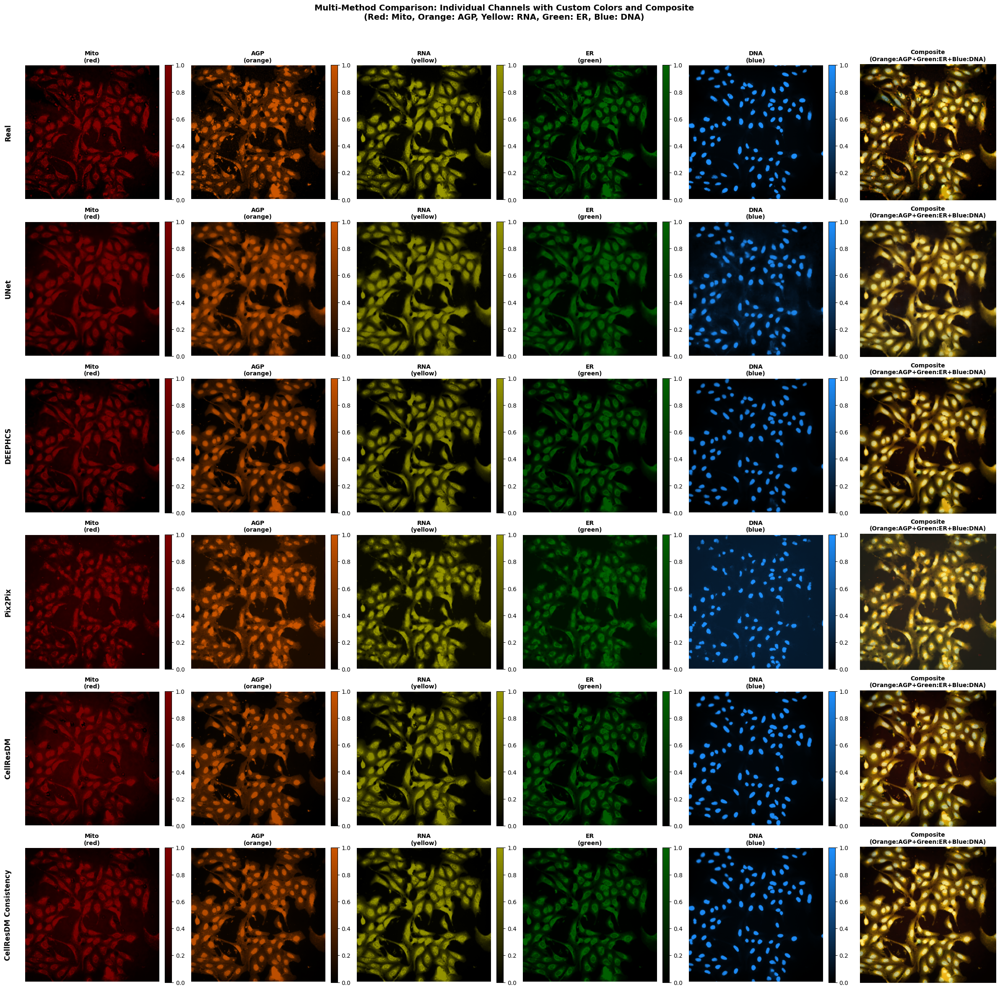

In [21]:
# Create comprehensive visualization showing individual channels and composites for all methods
# Define the order of methods to display (including real)
method_order = ['real', 'unet', 'deephcs', 'pix2pix', 'rescelldm', 'rescelldm_2step']
# Filter to only include methods that exist in method_data
ordered_methods = [(method, method_data[method]) for method in method_order if method in method_data]

n_methods = len(ordered_methods)
n_channels = 5  # Mito, AGP, RNA, ER, DNA
n_cols = 6  # 5 individual channels + 1 composite

fig, axes = plt.subplots(n_methods, n_cols, figsize=(24, 4*n_methods))

if n_methods == 1:
    axes = axes.reshape(1, -1)

for method_idx, (method_name, img_data) in enumerate(ordered_methods):
    # Individual channels with custom colormaps
    for channel_idx in range(n_channels):
        if len(img_data.shape) == 3 and channel_idx < img_data.shape[0]:
            # Normalize channel
            channel_data = img_data[channel_idx]
            channel_norm = (channel_data - channel_data.min()) / (channel_data.max() - channel_data.min() + 1e-8)
            
            # Get the colormap name for this channel
            channel_name = channel_names[channel_idx]
            cmap_name = channel_to_cmap.get(channel_name, 'red')
            
            im = axes[method_idx, channel_idx].imshow(channel_norm, cmap=cmaps[cmap_name], vmin=0, vmax=1)
            axes[method_idx, channel_idx].set_title(f'{channel_name}\n({cmap_name})', fontsize=10, fontweight='bold')
            axes[method_idx, channel_idx].axis('off')
            # Add colorbar
            plt.colorbar(im, ax=axes[method_idx, channel_idx], fraction=0.046, pad=0.04)
        else:
            axes[method_idx, channel_idx].text(0.5, 0.5, f'{channel_names[channel_idx]}\nNot Found', 
                                               transform=axes[method_idx, channel_idx].transAxes, 
                                               ha='center', va='center')
            axes[method_idx, channel_idx].axis('off')
    
    # Composite image using custom colors
    composite = create_composite(img_data)
    if composite is not None:
        axes[method_idx, -1].imshow(composite)
        axes[method_idx, -1].set_title('Composite\n(Orange:AGP+Green:ER+Blue:DNA)', fontsize=10, fontweight='bold')
    else:
        axes[method_idx, -1].text(0.5, 0.5, 'No composite', ha='center', va='center')
    axes[method_idx, -1].axis('off')
    
    # Add method name on the left with proper display names
    display_names = {
        'real': 'Real',
        'unet': 'UNet',
        'pix2pix': 'Pix2Pix', 
        'rescelldm': 'CellResDM',
        'rescelldm_2step': 'CellResDM Consistency'
    }
    display_name = display_names.get(method_name, method_name.upper())
    axes[method_idx, 0].text(-0.1, 0.5, display_name, rotation=90, 
                            transform=axes[method_idx, 0].transAxes, 
                            fontsize=12, fontweight='bold', va='center', ha='right')

# Add overall title
fig.suptitle('Multi-Method Comparison: Individual Channels with Custom Colors and Composite\n(Red: Mito, Orange: AGP, Yellow: RNA, Green: ER, Blue: DNA)', 
             fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()


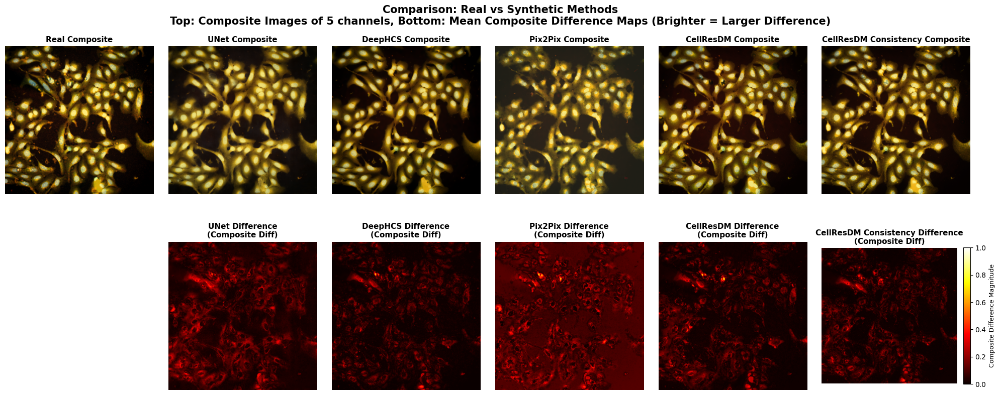

In [22]:
# Create a 2x5 figure: 2 rows (composite, difference) and 5 columns (real + 4 methods)
method_order = ['unet', 'deephcs', 'pix2pix', 'rescelldm', 'rescelldm_2step']
method_display_names = {
    'unet': 'UNet',
    'deephcs': 'DeepHCS',
    'pix2pix': 'Pix2Pix',
    'rescelldm': 'CellResDM',
    'rescelldm_2step': 'CellResDM Consistency'
}

if 'real' in method_data:
    real_data = method_data['real']
    real_composite = create_composite(real_data)
    
    # Get available methods in order
    available_methods = [m for m in method_order if m in method_data]
    n_methods = len(available_methods)
    
    if n_methods > 0:
        # Create 2x5 figure: 2 rows (composite, difference) and 5 columns (real + 4 methods)
        fig, axes = plt.subplots(2, 6, figsize=(20, 8))
        
        # First row: Composite images
        # Column 0: Real composite
        axes[0, 0].imshow(real_composite)
        axes[0, 0].set_title("Real Composite", fontsize=11, fontweight='bold')
        axes[0, 0].axis('off')
        
        # Columns 1-4: Method composites
        for idx, method in enumerate(available_methods):
            method_name = method_display_names.get(method, method.upper())
            synth_data = method_data[method]
            synth_composite = create_composite(synth_data)
            
            axes[0, idx + 1].imshow(synth_composite)
            axes[0, idx + 1].set_title(f"{method_name} Composite", fontsize=11, fontweight='bold')
            axes[0, idx + 1].axis('off')
        
        # Second row: Difference images
        # Column 0: Empty (no difference for real vs real)
        # axes[1, 0].text(0.5, 0.5, 'N/A\n(Real vs Real)', ha='center', va='center', fontsize=10)
        axes[1, 0].axis('off')
        
        # Columns 1-4: Method differences
        for idx, method in enumerate(available_methods):
            method_name = method_display_names.get(method, method.upper())
            synth_data = method_data[method]
            synth_composite = create_composite(synth_data)
            
            if real_composite is not None and synth_composite is not None:
                # Calculate difference between composite images (RGB channels)
                # This computes the absolute difference between real and synthetic composite images
                # and then takes the mean across all 3 RGB channels to get a single difference value per pixel
                diff = np.mean(np.abs(real_composite - synth_composite), axis=2)
                im = axes[1, idx + 1].imshow(diff, cmap='hot', vmin=0, vmax=1)
                axes[1, idx + 1].set_title(f"{method_name} Difference\n(Composite Diff)", fontsize=11, fontweight='bold')
                axes[1, idx + 1].axis('off')
                
                # Add colorbar for the last difference image
                if idx == len(available_methods) - 1:
                    cbar = plt.colorbar(im, ax=axes[1, idx + 1], fraction=0.046, pad=0.04)
                    cbar.set_label('Composite Difference Magnitude', fontsize=9)
            else:
                axes[1, idx + 1].text(0.5, 0.5, 'No difference\n(composite failed)', 
                                      ha='center', va='center', fontsize=10)
                axes[1, idx + 1].axis('off')
        
        # Set overall title and adjust layout
        fig.suptitle('Comparison: Real vs Synthetic Methods\nTop: Composite Images of 5 channels, Bottom: Mean Composite Difference Maps (Brighter = Larger Difference)', 
                     fontsize=15, fontweight='bold', y=0.98)
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.88, hspace=0.3, wspace=0.1)
        plt.show()
    else:
        print("No synthetic methods available for comparison")
else:
    print("Real data not available for comparison")


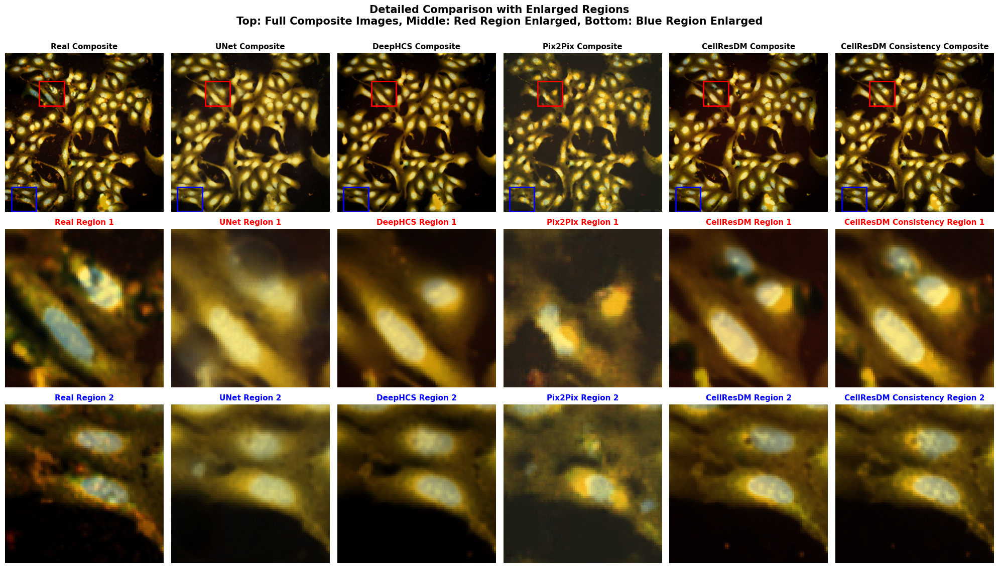

In [25]:
# Create a 3x5 figure with insets: 1 row composite, 2 rows for enlarged regions
method_order = ['unet', 'deephcs', 'pix2pix', 'rescelldm', 'rescelldm_2step']
method_display_names = {
    'unet': 'UNet',
    'deephcs': 'DeepHCS',
    'pix2pix': 'Pix2Pix',
    'rescelldm': 'CellResDM',
    'rescelldm_2step': 'CellResDM Consistency'
}

if 'real' in method_data:
    real_data = method_data['real']
    real_composite = create_composite(real_data)
    
    # Get available methods in order
    available_methods = [m for m in method_order if m in method_data]
    n_methods = len(available_methods)
    
    if n_methods > 0:
        # Define two regions to enlarge by specifying left-top and right-bottom corners
        # Region 1: left-top (100, 100), right-bottom (180, 180) -> 80x80 pixels
        region1 = {'left': 110, 'top': 90, 'right': 190, 'bottom': 170}
        # Region 2: left-top (300, 200), right-bottom (380, 280) -> 80x80 pixels  
        # region2 = [0, 440, 140, 590)]
        region2 = {'left': 20, 'top': 432, 'right': 100, 'bottom': 512}
        
        # Create 3x5 figure: 1 row composite + 2 rows for enlarged regions
        fig, axes = plt.subplots(3, 6, figsize=(20, 12))
        
        # First row: Composite images with inset rectangles
        # Column 0: Real composite
        axes[0, 0].imshow(real_composite)
        axes[0, 0].set_title("Real Composite", fontsize=11, fontweight='bold')
        axes[0, 0].axis('off')
        
        # Add rectangle overlays for regions
        from matplotlib.patches import Rectangle
        rect1_width = region1['right'] - region1['left']
        rect1_height = region1['bottom'] - region1['top']
        rect2_width = region2['right'] - region2['left']
        rect2_height = region2['bottom'] - region2['top']
        
        rect1 = Rectangle((region1['left'], region1['top']), rect1_width, rect1_height, 
                         linewidth=2, edgecolor='red', facecolor='none')
        rect2 = Rectangle((region2['left'], region2['top']), rect2_width, rect2_height, 
                         linewidth=2, edgecolor='blue', facecolor='none')
        axes[0, 0].add_patch(rect1)
        axes[0, 0].add_patch(rect2)
        
        # Columns 1-4: Method composites with rectangles
        for idx, method in enumerate(available_methods):
            method_name = method_display_names.get(method, method.upper())
            synth_data = method_data[method]
            synth_composite = create_composite(synth_data)
            
            axes[0, idx + 1].imshow(synth_composite)
            axes[0, idx + 1].set_title(f"{method_name} Composite", fontsize=11, fontweight='bold')
            axes[0, idx + 1].axis('off')
            
            # Add rectangle overlays
            rect1_copy = Rectangle((region1['left'], region1['top']), rect1_width, rect1_height, 
                                  linewidth=2, edgecolor='red', facecolor='none')
            rect2_copy = Rectangle((region2['left'], region2['top']), rect2_width, rect2_height, 
                                  linewidth=2, edgecolor='blue', facecolor='none')
            axes[0, idx + 1].add_patch(rect1_copy)
            axes[0, idx + 1].add_patch(rect2_copy)
        
        # Second row: Enlarged region 1 (red rectangles)
        # Column 0: Real region 1
        real_region1 = real_composite[region1['top']:region1['bottom'], 
                                     region1['left']:region1['right']]
        axes[1, 0].imshow(real_region1)
        axes[1, 0].set_title("Real Region 1", fontsize=11, fontweight='bold', color='red')
        axes[1, 0].axis('off')
        
        # Columns 1-4: Method region 1
        for idx, method in enumerate(available_methods):
            method_name = method_display_names.get(method, method.upper())
            synth_data = method_data[method]
            synth_composite = create_composite(synth_data)
            
            synth_region1 = synth_composite[region1['top']:region1['bottom'], 
                                          region1['left']:region1['right']]
            axes[1, idx + 1].imshow(synth_region1)
            axes[1, idx + 1].set_title(f"{method_name} Region 1", fontsize=11, fontweight='bold', color='red')
            axes[1, idx + 1].axis('off')
        
        # Third row: Enlarged region 2 (blue rectangles)
        # Column 0: Real region 2
        real_region2 = real_composite[region2['top']:region2['bottom'], 
                                     region2['left']:region2['right']]
        axes[2, 0].imshow(real_region2)
        axes[2, 0].set_title("Real Region 2", fontsize=11, fontweight='bold', color='blue')
        axes[2, 0].axis('off')
        
        # Columns 1-4: Method region 2
        for idx, method in enumerate(available_methods):
            method_name = method_display_names.get(method, method.upper())
            synth_data = method_data[method]
            synth_composite = create_composite(synth_data)
            
            synth_region2 = synth_composite[region2['top']:region2['bottom'], 
                                          region2['left']:region2['right']]
            axes[2, idx + 1].imshow(synth_region2)
            axes[2, idx + 1].set_title(f"{method_name} Region 2", fontsize=11, fontweight='bold', color='blue')
            axes[2, idx + 1].axis('off')
        
        # Set overall title and adjust layout
        fig.suptitle('Detailed Comparison with Enlarged Regions\nTop: Full Composite Images, Middle: Red Region Enlarged, Bottom: Blue Region Enlarged', 
                     fontsize=15, fontweight='bold', y=0.96)
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.90)
        plt.show()
    else:
        print("No synthetic methods available for comparison")
else:
    print("Real data not available for comparison")

